# Image segmentation task with U-net model.

In [ ]:
!pip install -r requirements.txt #Install needed libraries

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import re
import os
from PIL import Image
import tensorflow as tf
from tensorflow import keras



C:\Users\deika\AppData\Local\Temp\ipykernel_21856\3629556484.py:3: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd



Count of dataset:231723
         ImageId                                      EncodedPixels
0  00003e153.jpg                                                NaN
1  0001124c7.jpg                                                NaN
2  000155de5.jpg  264661 17 265429 33 266197 33 266965 33 267733...
3  000194a2d.jpg  360486 1 361252 4 362019 5 362785 8 363552 10 ...
4  000194a2d.jpg  51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


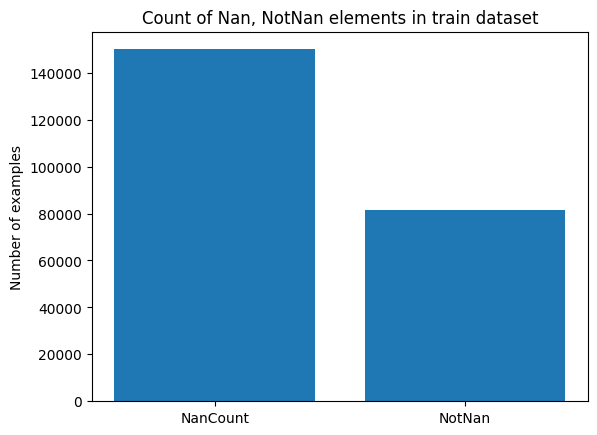


 Number of examples with N ships in image:
0     150000
1      27104
2       7674
3       2954
4       1622
5        925
6        657
7        406
8        318
9        243
10       168
11       144
12       124
13        75
14        76
15        66
dtype: int64


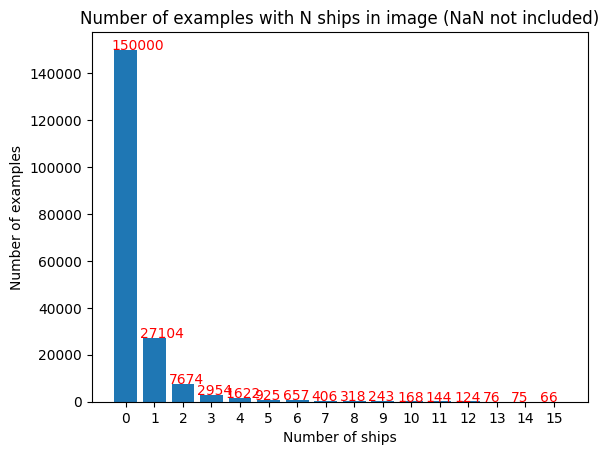

In [4]:
dataset_train = pd.read_csv('train_dataset.csv')


print('\nCount of dataset:'+str(dataset_train['EncodedPixels'].size))

print(dataset_train.head())

NanCount=dataset_train['EncodedPixels'].isna().sum()
NotNan=dataset_train['EncodedPixels'].size-NanCount
CountTrainData=[NanCount,NotNan]

plt.figure()
plt.bar(['NanCount', 'NotNan'],CountTrainData)
plt.ylabel('Number of examples')
plt.title('Count of Nan, NotNan elements in train dataset')
plt.show()


print('\n Number of examples with N ships in image:')
numb_arr=(dataset_train['ImageId'].value_counts()).value_counts()
numb_arr.loc[1]=numb_arr.loc[1]-NanCount
numb_arr=pd.concat([pd.Series(NanCount,index=[0]),numb_arr])
print(numb_arr.sort_index())

plt.figure()
x_temp=numb_arr.values
plt.bar(numb_arr.index,numb_arr,tick_label=numb_arr.index)
plt.xlabel('Number of ships')
plt.ylabel('Number of examples')
for index, value in enumerate(x_temp):
    plt.text(index-0.5,value+5,str(value),color='red') #Labels for bars
plt.title('Number of examples with N ships in image (NaN not included)')
plt.show()



dataset=pd.merge(dataset_train,dataset_train['ImageId'].value_counts(),"left",'ImageId') #Merge masks Run Lenght encoding and 
dataset['count']=np.array([0 if pd.isna(row[1]['EncodedPixels']) is True else row[1]['count'] for row in dataset.iterrows()])#Subtract a number of NAN values that recognised as a class with 1 ship on image.
dataset=dataset.drop_duplicates(subset=['ImageId'])
dataset=dataset.drop(columns=['EncodedPixels'])
dataset.rename(columns = {'count':'number_of_ships'}, inplace = True)
dataset.to_csv('edited_train_dataset.csv') #



### Creation of mask images
The program iterate rows in 'train_dataset.csv' and reads RLE (Run-length encoding) for ship that located on image. It accumulate these encodings into one variable, then it fills a matrix of zeros with ones coresponding to mask's encoding. It creates one mask, that contains all ships. After creating an matrix of mask, it saves mask image into a directory with masks. So by this way program runs all images in 'train_dataset.csv' and creates masks.
RLE reading is performed by regular expression functions.


In [ ]:
## To run this code you need to set a path to raw data

PATH='D:/test_task_winger/' #path to raw data


def create_mask_image(path, image_name, pixels, train=None):
    img = np.asarray(Image.open(path + 'train/' + image_name)) / 255

    IMG_HEIGHT=img.shape[0]
    IMG_WIDTH=img.shape[1]

    mask_image=np.zeros((IMG_HEIGHT,IMG_WIDTH))

    if(len(pixels)==0):
        #return just black picture because no mask for this photo
        print('return just black picture because no mask for this photo')
    else:
        pattern = '\d*'
        for pixel_set in pixels: #Each set in pixels represent one ship
            for pixel in pixel_set:
                match = re.split(r' +',pixel)

                column=int(match[0])//IMG_HEIGHT #Getting number of column
                start_pixel=int(match[0])%IMG_HEIGHT #Getting number of row
                current_pixel=start_pixel #Initialization for loop
                bias=0
                for i in range(int(match[1])):

                    if (current_pixel+i >= IMG_HEIGHT):#If pixel is getting out of bounds, then change column from row 0
                        bias=i
                        if ((column+1) >= IMG_WIDTH):
                            column=0
                        else: column+=1

                        current_pixel=0

                    mask_image[current_pixel+i-bias,column]=1

    if train is True:
        match=re.sub('.jpg','_train_mask.jpg',image_name) #Create a new image name
    else:
        match = re.sub('.jpg', '_test_mask.jpg', image_name)

    mask_image = (mask_image*255).astype(np.uint8)
    Image.fromarray(mask_image).save(path+'masks/'+match) #Saving mask

    #photo_test=plt.imread(path+'masks/'+match)
    print("Creating image's masks is finished")

def get_mask_image(dataset,PATH,train=None):
    if train is True:
        PATH=PATH+'input_data/'


    edited_pixels = []
    images_dataset=[]
    pixels_dataset=[]
    saved_image=None

    for index, row in dataset.iterrows():
        image = row['ImageId']
        if index ==0: saved_image=image
        #Explaining:
        #We save pixels each step, but if images are the same, we concatenate these pixels and continue to extract new pixels. When image is changed,
        # we will see it with condition "image != saved_image" and then we append saved image name and mask pixels to general dataset and clear the variables

        if image!=saved_image:
            images_dataset.append(saved_image)
            pixels_dataset.append(edited_pixels)
            #create mask image and save it in directory in folder 'masks'

            mask_image=create_mask_image(PATH,saved_image,edited_pixels,train=True)

            edited_pixels=[] #Clearing variable

        pixels=row['EncodedPixels']
        saved_image=image

        if str(pixels) != 'nan':
            print(pixels)
            #Get pair of number with null or multiple digits with space(s) and then number with multiple or null digits and again space(s)
            pattern='(\d*\s*\d*\s*)'

            match = re.split(pattern, pixels)
            print(match)
            while ("" in match): #We have "" elements in array, so program deletes these elements and save only coordinates
                match.remove("")
            else: print("Deleting of empty str completed. ")
            print(match)
            edited_pixels.append(match)
    print('Pixels convertion  is done!')



    return images_dataset,pixels_dataset

dataset_train=pd.read_csv('train_dataset.csv')
x_images_train_dataset,Y_mask_train_dataset=get_mask_image(dataset_train,PATH,train=True)

print('Masks creation is completed')

# Data preprocessing
Total size of dataset is 231723, where images with 0 ships are a majority (150k). 

### Creation of train and validation datasets
Difference in examples where images with 0 or 1 ship to 2-15 ships goes from 2000/1 to 5/1. To create a balance between classes, i decided to set a limit to the number of examples for each class to 200 images and split the generated dataset into a train and validation datasets. 

In a result, i received sets of 1960 train and 654 validation images. Some of classes received way lesser number of images than 200, because of the purpose of going in depth of the dataset to prevent that 200 example images for 0_ship_images will be gotten from first 200 images that meet a condition that this image has N ships. 

For each dataset created a particular list with image's names.


In [5]:
'''
This code will generate new file that can not match images in dataset folder.
'''



import random
from sklearn.model_selection import train_test_split
import re

seed=42
random.seed(seed)

dataset=pd.read_csv('edited_train_dataset.csv')#read edited csv with label of counted ships on the image

count_numbers_occurence=dataset['number_of_ships'].value_counts()
list_of_numbers=np.sort(dataset['number_of_ships'].unique())
new_dataset=[]
max_occur_numb=200
for number in list_of_numbers:
    count=0 #Count 200 images
    for row in dataset.iterrows():
        while ((count < max_occur_numb) & (count < count_numbers_occurence[number])): #If count is less than 200 and total number of occurence in dataset, then we get inside of a loop
            if row[1]['number_of_ships']==number:

                if count_numbers_occurence[number]>5*max_occur_numb:
                    if random.random()>0.9: # it's made to diversify dataset with data that take the bigger part in whole dataset (e.g. number of ships 0, 1 , 2). It helps us to not get the first 200 images. So by this way we can go deep inside dataset
                        new_dataset.append(row[1]) #Add image to new dataset
                        count+=1
                        break
                    else:
                        break
                else:
                    new_dataset.append(row[1]) #If total number of images of particular class is less than 200, then we just add image to dataset
                    count += 1
                    break
            else: break

        else:
            print('Dataset creating for [' + str(number) + '] is over.')
            break

        continue

new_dataset=pd.DataFrame(new_dataset)
new_dataset.to_csv('dataset_images.csv') #Saving a dataframe with training and validation image names


Dataset creating for [0] is over.
Dataset creating for [1] is over.
Dataset creating for [2] is over.


KeyboardInterrupt: 

### Creation of datasets
To create a sctructure for training data, program split images into training and validation lists. We iterate each created list. During iteration it saves an original photo into a directory "train_images/images/" or "val_images/images/". The same algorithm with a mask image. Program adds to ending of the image an ending "_train_mask" and find this mask by name in folder with masks. As it found the image, it moves the mask image to folder "train_masks/masks/" or "val_masks/masks/".

In [1]:
## To run this code you need to set a path to folder where is RGB images and Masks splited into "train" and "masks" folders

PATH='D:/test_task_winger/input_data/'


new_dataset=pd.read_csv('dataset_images.csv')
x_train,x_test=train_test_split(new_dataset) #train/test == 1/4


for row in x_train.iterrows():

    img = np.asarray(Image.open(PATH +'train/'+ row[1]['ImageId']))  #Open an RGB image from train dataset
    mask_img=np.asarray(Image.open(PATH +'masks/'+ re.sub('.jpg', '_train_mask.jpg', row[1]['ImageId']))) #Open mask image from train dataset

    Image.fromarray(img).save('dataset/train_images/images/' + row[1]['ImageId'])#Save an image into a new folder with train RGB images
    Image.fromarray(mask_img).save('dataset/train_masks/masks/' + re.sub('.jpg', '_train_mask.jpg', row[1]['ImageId']))#Save a mask image into a new folder with train masks

for row in x_test.iterrows():

    img = np.asarray(Image.open(PATH +'train/'+ row[1]['ImageId'])) #Open an RGB image from validation dataset
    mask_img=np.asarray(Image.open(PATH +'masks/'+ re.sub('.jpg', '_train_mask.jpg', row[1]['ImageId'])))#Open mask image from test dataset

    Image.fromarray(img).save('dataset/val_images/images/' + row[1]['ImageId'])
    Image.fromarray(mask_img).save('dataset/val_masks/masks/' + re.sub('.jpg', '_train_mask.jpg', row[1]['ImageId']))#Save a mask image into a new folder with train masks

print('Dataset creation completed')


NameError: name 'pd' is not defined


### Histogram for new dataset

Further this dataset will be divided into train and validation datasets.

number_of_ships
0     200
1     200
2     200
3     200
4     161
5     200
6     200
7     200
8     200
9     200
10    168
11    144
12    124
13     75
14     76
15     66
Name: count, dtype: int64


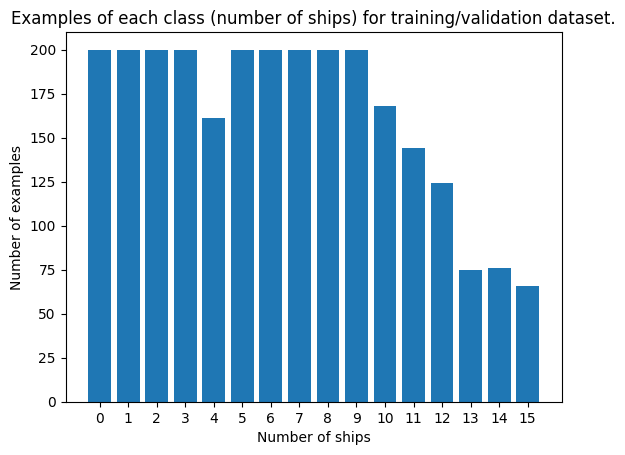

In [6]:

plt.figure()
created_dataset=pd.read_csv('dataset_images.csv')
numb_arr=(created_dataset['number_of_ships'].value_counts()).sort_index()
print(numb_arr)
plt.bar(numb_arr.index,numb_arr,tick_label=numb_arr.index)
plt.title('Examples of each class (number of ships) for training/validation dataset.')
plt.xlabel('Number of ships')
plt.ylabel('Number of examples')
plt.show()

# Model architecture

For image segmentation was used U-Net model architecture. Code for model architecture was taken from https://youtu.be/68HR_eyzk00 .

As a loss function was taken a dice loss that was optimized with Adam optimizer. The task formulation requires from a solution to use F2 score, so after ending of epoch calculation program will be outputing a loss and f2 score for current epoch. 


An image of model architecture:

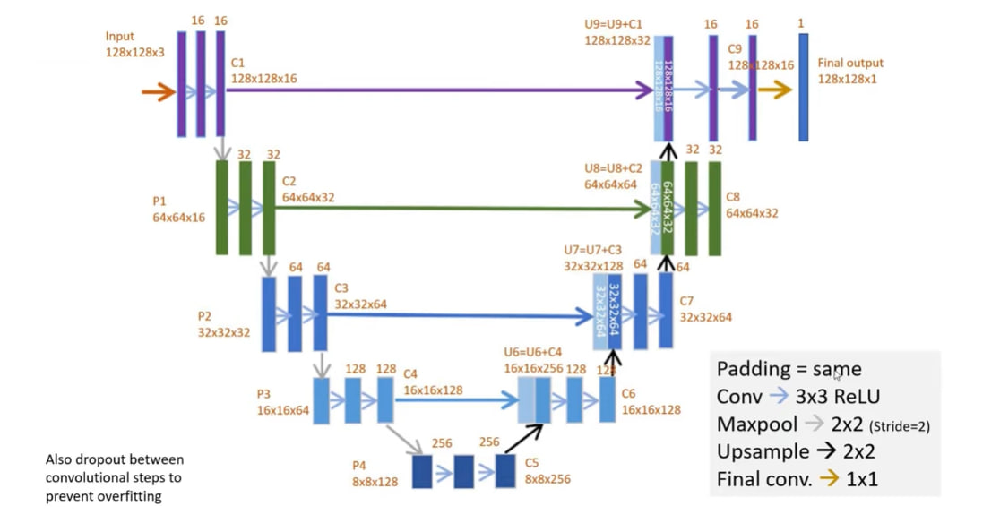




In [ ]:
input=tf.keras.layers.Input(shape=(IMG_HEIGHT,IMG_WIDTH,CHANNELS))

# Encoding part
U1=tf.keras.layers.Conv2D(16,3,padding='same',activation='relu',kernel_initializer='he_normal')(input)
U1=tf.keras.layers.Dropout(0.2)(U1)
U1=tf.keras.layers.Conv2D(16,3,padding='same',activation='relu',kernel_initializer='he_normal')(U1)

U2=tf.keras.layers.MaxPooling2D()(U1)
U2=tf.keras.layers.Conv2D(32,3,padding='same',activation='relu',kernel_initializer='he_normal')(U2)
U2=tf.keras.layers.Dropout(0.2)(U2)
U2=tf.keras.layers.Conv2D(32,3,padding='same',activation='relu',kernel_initializer='he_normal')(U2)

U3=tf.keras.layers.MaxPooling2D()(U2)
U3=tf.keras.layers.Conv2D(64,3,padding='same',activation='relu',kernel_initializer='he_normal')(U3)
U3=tf.keras.layers.Dropout(0.2)(U3)
U3=tf.keras.layers.Conv2D(64,3,padding='same',activation='relu',kernel_initializer='he_normal')(U3)

U4=tf.keras.layers.MaxPooling2D()(U3)
U4=tf.keras.layers.Conv2D(128,3,padding='same',activation='relu',kernel_initializer='he_normal')(U4)
U4=tf.keras.layers.Dropout(0.2)(U4)
U4=tf.keras.layers.Conv2D(128,3,padding='same',activation='relu',kernel_initializer='he_normal')(U4)

U5=tf.keras.layers.MaxPooling2D()(U4)
U5=tf.keras.layers.Conv2D(256,3,padding='same',activation='relu',kernel_initializer='he_normal')(U5)
U5=tf.keras.layers.Dropout(0.2)(U5)
U5=tf.keras.layers.Conv2D(256,3,padding='same',activation='relu',kernel_initializer='he_normal')(U5)


# Decoding part
I1=tf.keras.layers.Conv2DTranspose(128,(2,2),strides=(2,2),padding='same',activation='relu',kernel_initializer='he_normal')(U5) #Upsampling layer
U6=tf.keras.layers.concatenate([I1,U4])
U6=tf.keras.layers.Conv2D(128,(3,3),padding='same',activation='relu',kernel_initializer='he_normal')(U6)
U6=tf.keras.layers.Dropout(0.2)(U6)
U6=tf.keras.layers.Conv2D(128,3,padding='same',activation='relu',kernel_initializer='he_normal')(U6)

I2=tf.keras.layers.Conv2DTranspose(64,(2,2),strides=(2,2),padding='same',activation='relu',kernel_initializer='he_normal')(U6) #Upsampling layer
U7=tf.keras.layers.concatenate([I2,U3])
U7=tf.keras.layers.Conv2D(64,3,padding='same',activation='relu',kernel_initializer='he_normal')(U7)
U7=tf.keras.layers.Dropout(0.2)(U7)
U7=tf.keras.layers.Conv2D(64,3,padding='same',activation='relu',kernel_initializer='he_normal')(U7)

I3=tf.keras.layers.Conv2DTranspose(32,(2,2),strides=(2,2),padding='same',activation='relu',kernel_initializer='he_normal')(U7) #Upsampling layer
U8=tf.keras.layers.concatenate([I3,U2])
U8=tf.keras.layers.Conv2D(32,3,padding='same',activation='relu',kernel_initializer='he_normal')(U8)
U8=tf.keras.layers.Dropout(0.2)(U8)
U8=tf.keras.layers.Conv2D(32,3,padding='same',activation='relu',kernel_initializer='he_normal')(U8)

I4=tf.keras.layers.Conv2DTranspose(16,(2,2),strides=(2,2),padding='same',activation='relu',kernel_initializer='he_normal')(U8) #Upsampling layer
U9=tf.keras.layers.concatenate([I4,U1])
U9=tf.keras.layers.Conv2D(16,3,padding='same',activation='relu',kernel_initializer='he_normal')(U9)
U9=tf.keras.layers.Dropout(0.2)(U9)
U9=tf.keras.layers.Conv2D(16,3,padding='same',activation='relu',kernel_initializer='he_normal')(U9)

outputs=tf.keras.layers.Conv2D(1,(1,1),activation='sigmoid')(U9)

#####################

model=tf.keras.Model(inputs=[input],outputs=[outputs])

# Model training

### Fit function

Training a model with that size of data requires a lot of machine resources. Adding to this we should give attention to small objects that can occupy a little space of image. So for that purpose, the model was trained with images in the original dimension (768x768 pixels) because after an image resizing to a smaller dimension, we would lose information about tiny ships.  


As mentioned before, we split our images into four folders. For training a model with data that cannot be fitted in RAM, we can use keras built-in fit function (fit_generator) that receives as X a generator of data. As a generator of data we can use keras built-in function for data augmentation that receives a directory with images. Generator has a bunch of parameters for image rotating, flipping, resizing, but we will use only rescaling from 0-255 to 0-1. For each folder we have one generator, X and Y generators zipped by training or validation group and fitted in a model.






In [ ]:
'''
#Generators for data
'''
PATH='dataset/' #Path to folders with generated dataset

image_generator_params=dict(rescale=1/255)  # Augmentation settings: just rescale pixels from 0-255 to 0-1.

image_data_generator=ImageDataGenerator(**image_generator_params) #ImageDataGenerator initialization

train_image_generator = image_data_generator.flow_from_directory(directory=PATH+'train_images/',
                                                            seed=SEED,
                                                            batch_size=BATCH_SIZE,
                                                            target_size=(768,768),
                                                            class_mode=None)


train_mask_generator = image_data_generator.flow_from_directory(directory=PATH+'train_masks/',
                                                            seed=SEED,
                                                            batch_size=BATCH_SIZE,
                                                            color_mode='grayscale',
                                                            target_size=(768,768),
                                                            class_mode=None)

val_image_generator = image_data_generator.flow_from_directory(directory=PATH+'val_images/',
                                                            seed=SEED,
                                                            batch_size=BATCH_SIZE,
                                                            target_size=(768,768),
                                                            class_mode=None)


val_mask_generator = image_data_generator.flow_from_directory(directory=PATH+'val_masks/',
                                                            seed=SEED,
                                                            batch_size=BATCH_SIZE,
                                                            color_mode='grayscale',
                                                            target_size=(768,768),
                                                            class_mode=None)

train_generator=zip(train_image_generator,train_mask_generator) #combining images with true masks 
val_generator=zip(val_image_generator,val_mask_generator)


## Callbacks, metrics, loss function
To optimize training process i will use ModelCheckpoint which saves weights for each epoch (or best_only when indicator has a bigger or smaller value than on previous epochs). Also, i used a learning rate scheduler that changes a learning rate after a particular number of epochs. This function helps us to prevent a stucking in a local minimum.



In [ ]:
'''
Callbacks, metrics and loss initialization
'''
PATH='dataset/' #Path to processed dataset

SEED=42
BATCH_SIZE=5
IMG_HEIGHT=768
IMG_WIDTH=768
CHANNELS=3
TRAIN_SIZE=len(os.listdir(PATH+'train_images/images/'))
VAL_SIZE=len(os.listdir(PATH+'val_images/images/'))

import segmentation_models as sm

import segmentation_models as sm
dice_loss = sm.losses.DiceLoss() #Loss initialization

opt=keras.optimizers.Adam(learning_rate=0.0001) #Optimizer initialization

thresholds=[0.5,0.55,0.6,0.65,0.7,0.75,0.8,0.85,0.9,0.95] #Thresholds for F2 score

metrics=[sm.metrics.IOUScore(threshold=0.5)
    # ,F2_score(threshold=thresholds,batch_size=BATCH_SIZE) ####Custom F2 score function will not be used in a training process because it increases evaluation time significantly
         ]

mc = tf.keras.callbacks.ModelCheckpoint('temp_models/dice_loss/{epoch:02d}__{loss:02f}__{val_loss:02f}__{iou_score:02f}__{val_iou_score:02f}.keras',
                                        monitor='val_loss', mode='min',verbose=1) #ModelCheckpoint initalization

def scheduler(epoch, lr):
    if epoch<2:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

lrsch=tf.keras.callbacks.LearningRateScheduler(scheduler)

model.compile(optimizer=opt,loss=dice_loss,metrics=metrics,run_eagerly=True)

'''
Model training
'''
history=model.fit_generator(generator=train_generator,
                    validation_data=val_generator,epochs=20,steps_per_epoch=steps_per_epoch,validation_steps=steps_per_epoch,
                workers=6, callbacks=[mc,lrsch])

# Training log

Total number of epochs is around 110, where each epoch takes about 15-25 minutes to calculate where batch size is 5 images. I haven't saved a whole training history because of the error that happens because of insufficient memory (fit_generator still had epochs to train a model, so it didn't export csv with history and saved model in .h5). But i can restore val_loss data with modelcheckpoint savings that contain epoch and loss in the name. After two times of getting an error, i specified a modelcheckpoint name to save more data about the epoch in a weight file's name. 

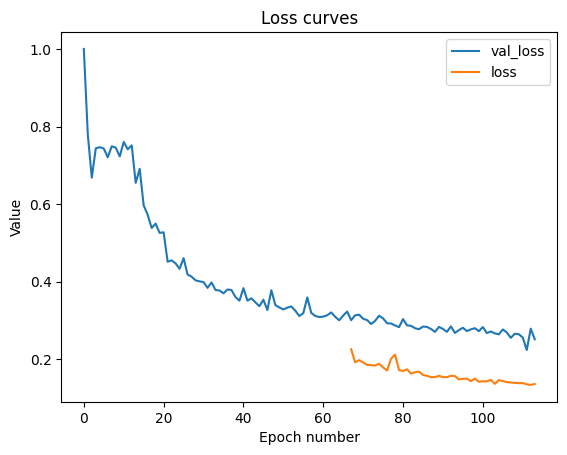

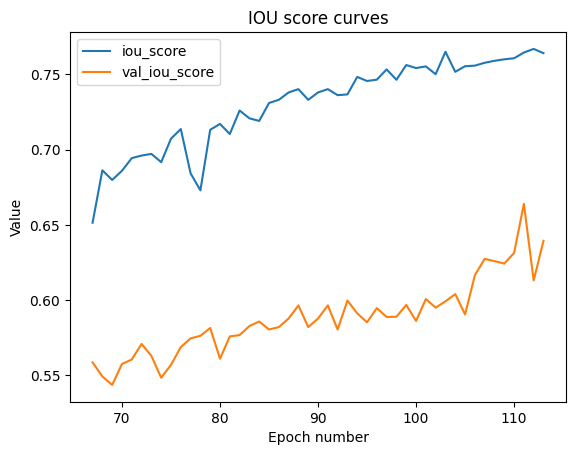

In [12]:
history_combined=pd.read_csv('history_combined.csv')

plt.figure()
plt.plot(history_combined['val_loss'],label='val_loss')
plt.plot(history_combined['loss'],label='loss')
plt.xlabel('Epoch number')
plt.ylabel('Value')
plt.title('Loss curves')
plt.legend()

plt.figure()
plt.plot(history_combined['iou_score'],label='iou_score')
plt.plot(history_combined['val_iou_score'],label='val_iou_score')
plt.xlabel('Epoch number')
plt.ylabel('Value')
plt.title('IOU score curves')
plt.legend()

# Model performance

Let's show model's prediction and compare it to ground truth images.

To assess the model prediction, I will use a custom F2 score that based on IOU score. There are already created functions of metric that compare each pixel between true and predict image, but in our case we need to compare ship's objects. The hardest part of this is to divide one mask image into several images that contain each object. For this purpose i have used label function from scikit-image library, which detects pixels that located closely and sets a mark on them. After this manipulation with image, i can compare each true mask with the predicted mask of object.


The best situation is when a true mask and predict are similar and were divided into the same number of masks. But in reality you can receive a 2-5 masks of true image and only two of predicted. So, in this situation, algorithm will compare each true mask with predicted mask and evaluate an overlap and union. If there's some overlap we compare Intersection over Union value to settled threshold and mark our mask with 1 if evaluated value is bigger than settled threshold. Unless it bigger, it will be marked with the evaluated value.

This comparison give us a tensor of dimension (size_true_mask x size_pred_mask x threshold). For each true mask we have comparison to each object on the predicted  mask. This tensor will help us to calculate True Positives, False Positives, False Negatives. For exampe, true positives will be detected in the tensor as 1, false positives as value in interval (0-1). To calculate False Negatives we subtract number of TruePositives and FalsePositive from number of masks on prediction image, also we need to subtract an 1, because labeled prediction mask includes a background image that doesn't have any object. 


After those calculation we can evaluate a F2 score. For this procedure of F2 score evaluation, i've wrotten a custom class.

In [3]:
##F2 score
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
from skimage.morphology import label

tf.config.experimental_run_functions_eagerly(True)
class F2_score(keras.metrics.Metric):
    def __init__(self, threshold=[0.5],batch_size=1,batch_processing=True,name = 'F2_score', **kwargs):
        super(F2_score, self).__init__(**kwargs)
        self.F2_score = self.add_weight('F2_score', initializer = 'zeros')
        self.threshold=threshold
        self.B=2
        self.batch_processing=batch_processing
        self.F2_score_per_threshold=self.add_weight('F2_score_per_threshold',shape=(batch_size,len(threshold)), initializer = 'zeros')


    @tf.function
    def update_state(self, y_true, y_pred,sample_weight=None):
        # check if array is  a numpy array
        if type(y_true).__module__ != np.__name__:
            y_true_numpy = y_true.numpy()
        else:
            y_true_numpy = y_true

        if type(y_pred).__module__ != np.__name__:
            y_pred_numpy =  y_pred.numpy()
        else:
            y_pred_numpy = y_pred

        if (self.batch_processing is True): #Branch of algorithm for proccesing a batch of images

            #Rounding pixels to execute label function correctly
            y_true_numpy = np.array([[[1 if pixel > 0.5 else 0 for pixel in row[:]] for row in image[:]] for image in y_true_numpy[:]])
            y_pred_numpy = np.array([[[1 if pixel > 0.5 else 0 for pixel in row[:]] for row in image[:]] for image in y_pred_numpy[:]])

            batch_size=y_true_numpy.shape[0]
            scores=[]

            for img_num in range(batch_size):
                score=self.evaluate_score_for_image(y_pred_numpy[img_num],y_true_numpy[img_num],img_ind=img_num) #Evaluate F2 score for particular image
                scores.append(score) #Add a score for particular image to vector for scores of all images..

            score = np.mean(np.array(scores)) #Evaluate an average F2 score among all images in the batch.
            self.F2_score.assign(score) #Return a score

        else:
            y_pred_numpy=np.squeeze(y_pred_numpy)
            if (y_pred_numpy.shape == y_true_numpy.shape):

                #Rounding pixels to execute label function correctly
                y_true_numpy = np.array([[1 if pixel > 0.5 else 0 for pixel in row[:]] for row in y_true_numpy[:]]) 
                y_pred_numpy = np.array([[1 if pixel > 0.5 else 0 for pixel in row[:]] for row in y_pred_numpy[:]])

                score = self.evaluate_score_for_image(y_pred_numpy, y_true_numpy) # Evaluate F2 score for particular image 

                self.F2_score.assign(np.squeeze(score)) #Assign F2 score to variable to show metric result
            else:
                print("Image's shapes are not the same.")

    def evaluate_score_for_image(self, predicted_image,true_image,img_ind=0):
        score=0
        #Check if all image's pixels are black (mask is a zeros matrix) with diffrent combination. It created to output F2 score for masks without any ship on it.
       
        if (np.sum(true_image) == 0 and np.sum(predicted_image) == 0):
            return np.ones(len(self.threshold))  # return array of ones for each threshold
        elif (np.sum(true_image) != 0 and np.sum(predicted_image) == 0):
            return np.zeros(len(self.threshold))  # return array of zeros for each threshold
        elif np.sum(true_image) == 0 and np.sum(predicted_image) != 0 :
            return np.zeros(len(self.threshold)) #return array of zeros for each threshold
        else:
            true_masks = self.separate_into_masks(label(true_image)) #Creating a tensor of true masks where each mask is a single object. 
            pred_masks = self.separate_into_masks(label(predicted_image)) #Creating a tensor of predicted masks where each mask is a single object. 

            iou_tensor=[] #This tensor consist of matrix which quantity is a number of true masks. Each matrix has IOU score for each predicted masks - these values written in rows. For each threshold we have a column in this matrix.

            #True mask:
            '''
            Example of matrix:


                                threshold_0.5   threshold_0.55
            predicted_mask1      IOU_score        IOU_score
            predicted_mask2      IOU_score        IOU_score
            predicted_mask3      IOU_score        IOU_score


            IOU tensor consists of those matrices.


            '''

            for true_mask in true_masks:
                iou_matrix = []
                for pred_mask in pred_masks:

                    # for pred_mask in :
                    iou_vector = self.evaluate_ious(pred_mask, true_mask) # get a vector of iou score for a predicted mask to the true mask. Vector has a N-dimensional size, where N is number of thresholds
                    iou_matrix.append(iou_vector) # collect scores from all predicted mask to one true mask
                iou_tensor.append(iou_matrix) #collect all iou scores for all true masks in a tensor 


            iou_tensor=np.array(iou_tensor)

            F2_for_image=self.f2_score_eval(iou_tensor,img_ind=img_ind) # func to calculate true positive , false positive, false negative and evaluate F2 score

            return F2_for_image


    def f2_score_eval(self,tensor,img_ind=0):
        
        threshold_num=len(self.threshold)
        F2_scores=[]

        for threshold_ind in range(threshold_num): #Iterate each threshold. So we extract only one column from all in the matrices
            tp, fp, fn = 0, 0, 0

            tp=np.sum((tensor[:,:,threshold_ind]==1)>0) #If IOU score higher than threshold, we mark this as a 'hit'
            fp=np.sum((tensor[:,:,threshold_ind]>0)>0)-tp # Counting values that less than threshold
            fn=tensor.shape[1]-tp-fp-1 # get a number of predicted masks and subtract the number of true positive masks and false positive masks. Also we need to subtract 1 mask that belong to background
            F2_score=(1+self.B**2)*tp/((1+self.B**2)*tp+(self.B**2)*fn+fp+0.0000001) #Evaluation of F2 score, where we adding 0.0000001 in a denominator to except division by 0.
            F2_scores.append((F2_score)) #Collect F2 score for threshold
        F2_scores=np.array(F2_scores)
        if threshold_num>1:
            self.F2_score_per_threshold[img_ind].assign(F2_scores) #Assign a vector of F2 scores to vector of F2_scores
            F2_scores=np.mean(F2_scores) #Evaluation of an average value of F2 scores.
        return F2_scores


    def evaluate_ious(self, prediction, true):
        score_vector=np.zeros(len(self.threshold))

        overlap=np.sum(prediction*true) #calculating an overlap areas
        union=np.sum((true + prediction)==1)+overlap #calculating an union of areas
        iou=overlap/(union+0.0000001) # adding  a  0.0000001 is to except a division by zero
        for index,threshold in enumerate(self.threshold):
            if iou>0:

                #if intersect_over_union (iou) bigger than threshold, then we mark it as 1
                if iou>threshold:
                    score_vector[index]=1
                else:
                    #if value of iou isn't that big to be bigger than threshold, we mark it as value of metric.
                    # In future preprocessing we will say that it is a false positive prediction
                    score_vector[index]=iou
            else:
                #if value less than 0 then we say that it is a false negative prediction ( in the next steps of processing F2 score)
                score_vector[index] = 0

        return score_vector
    def separate_into_masks(self, labeled_image):

        masks_labels=np.unique(labeled_image) #Get an array of labels to iterate it in further.
        masks=[]
        for label in masks_labels:
            template = np.array([[1 if ((pixel == label) and (label != 0)) else 0 for pixel in rows] for rows in labeled_image]) #Creating a tensor of masks for a particular image
            masks.append(template)

        return np.array(masks)

    def reset_state(self):
        self.F2_score.assign(0)



    def result_for_thresholds(self):
        return self.F2_score_per_threshold

    def result(self):
        return self.F2_score



Instructions for updating:
Use `tf.config.run_functions_eagerly` instead of the experimental version.


Let's try our F2 score metric on the validation dataset and output the original image, ground truth and prediction image. Inside of the prediction image i added a F2 score value.

Images below are prediction of model that trained with images that have size 768x768 pixels. On each prediction mask located a F2 score.

1/1 [==============================] - 0s 41ms/step


<Figure size 640x480 with 0 Axes>

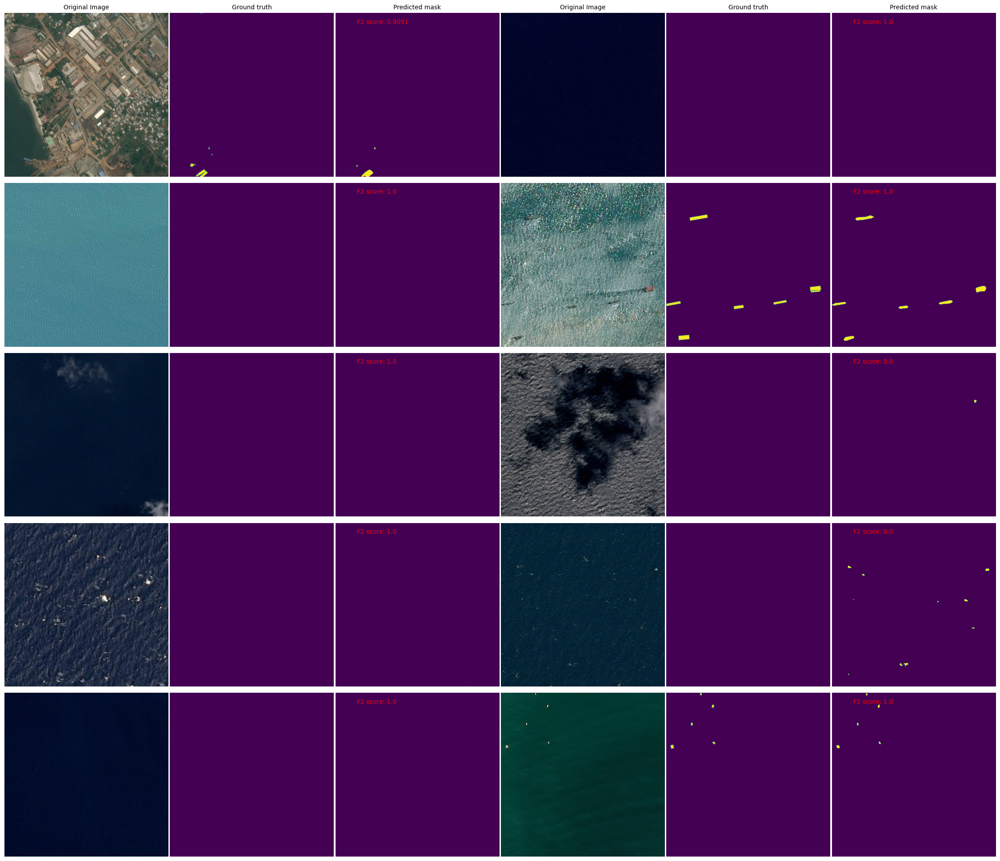

1/1 [==============================] - 0s 47ms/step


KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

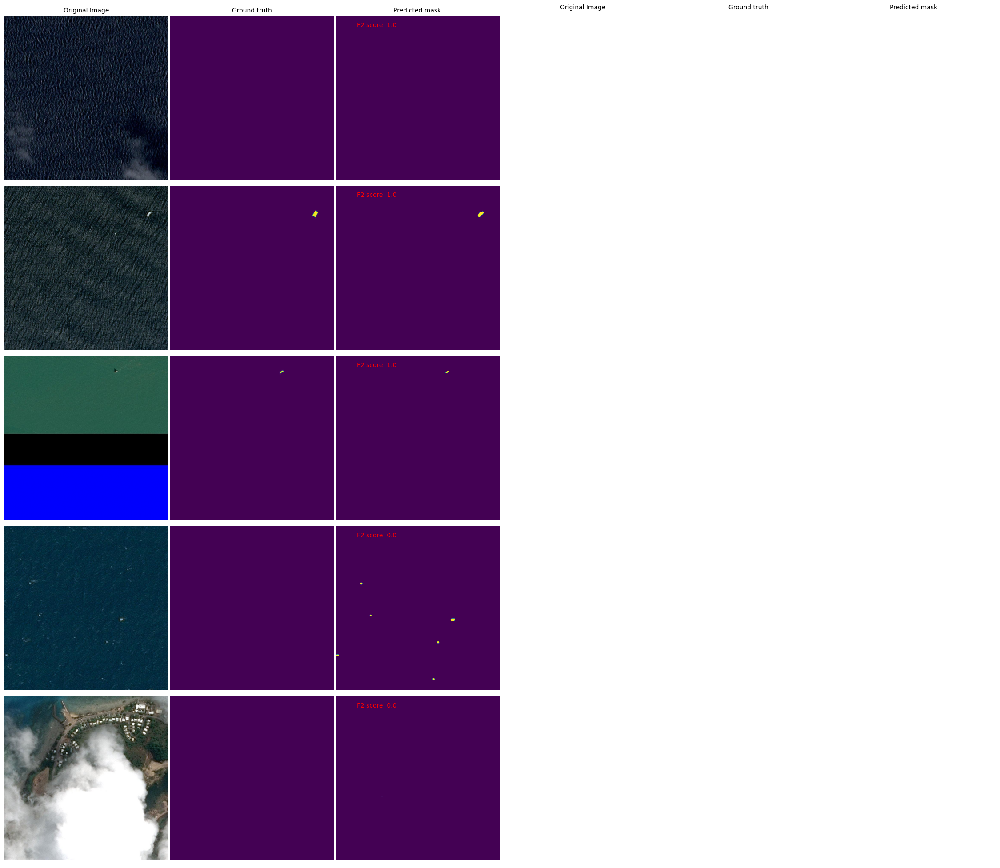

In [6]:
import segmentation_models as sm


image_path='dataset/val_images/images/'
mask_path='dataset/val_masks/masks/'


dice_loss = sm.losses.DiceLoss()

IOU_score=sm.metrics.IOUScore(threshold=0.5)

f2_score=sm.metrics.FScore(threshold=0.5,beta=2)
F2_score_array_768=[]
F2_score_metric=F2_score(threshold=[0.5],batch_processing=False)

unet_model=tf.keras.models.load_model('u_net_segmentation_model.h5',custom_objects={'dice_loss':dice_loss,'f2-score':f2_score,'iou_score':IOU_score}) #Model loading


images=os.listdir(path=image_path) #Read validation images' names
for batch_ind,img_temp in enumerate(images[:60:10]):
    plt.figure()
    fig, axs = plt.subplots(nrows=5, ncols=6,figsize=(27,20))

    plt.subplots_adjust(
        left=0.074, bottom=0.043,right=0.9,top=1,wspace=0.01, hspace=0
    )

    for ax in fig.axes:
        ax.axison = False

    axs[0][0].set_title(('Original Image'), fontdict={'fontsize': 10})
    axs[0][1].set_title('Ground truth', fontdict={'fontsize': 10})
    axs[0][2].set_title('Predicted mask', fontdict={'fontsize': 10})
    axs[0][3].set_title(('Original Image'), fontdict={'fontsize': 10})
    axs[0][4].set_title('Ground truth', fontdict={'fontsize': 10})
    axs[0][5].set_title('Predicted mask', fontdict={'fontsize': 10})

    for index,image in enumerate(images[(batch_ind)*10:(batch_ind+1)*10]):
        
        img_test = plt.imread(image_path + image) / 255
        image = re.sub('.jpg', '_train_mask.jpg', image)
        img_mask_test = plt.imread(mask_path + image) / 255

        img_predict_test = unet_model.predict(
            x=tf.reshape(img_test, shape=(-1, 768, 768, 3))) #predict a mask



        F2_score_metric.update_state(img_mask_test,img_predict_test) #evaluate F2 score for prediction
        F2_result=F2_score_metric.result()
        F2_score_array_768.append(F2_result.numpy())
        f2_score_text='F2 score: '+ str(round(F2_result.numpy(),4))

        if(index>4):
            axs[index-5][3].imshow(img_test)

            axs[index-5][4].imshow(img_mask_test)

            axs[index-5][5].imshow(np.squeeze(img_predict_test))
            axs[index-5][5].text(100,50,f2_score_text,color='red',fontsize=10)
        else:
            axs[index][0].imshow(img_test)

            axs[index][1].imshow(img_mask_test)

            axs[index][2].imshow(np.squeeze(img_predict_test))
            axs[index][2].text(100,50,f2_score_text,color='red',fontsize=10)
        
    plt.show()

print('Average F2 score:', np.mean(np.array(F2_score_array_768)))


### Comparison with model trained on smaller images
Images below are prediction of model that trained with images that have size 256х256 pixels. On each prediction mask located a F2 score.

1/1 [==============================] - 0s 36ms/step


<Figure size 640x480 with 0 Axes>

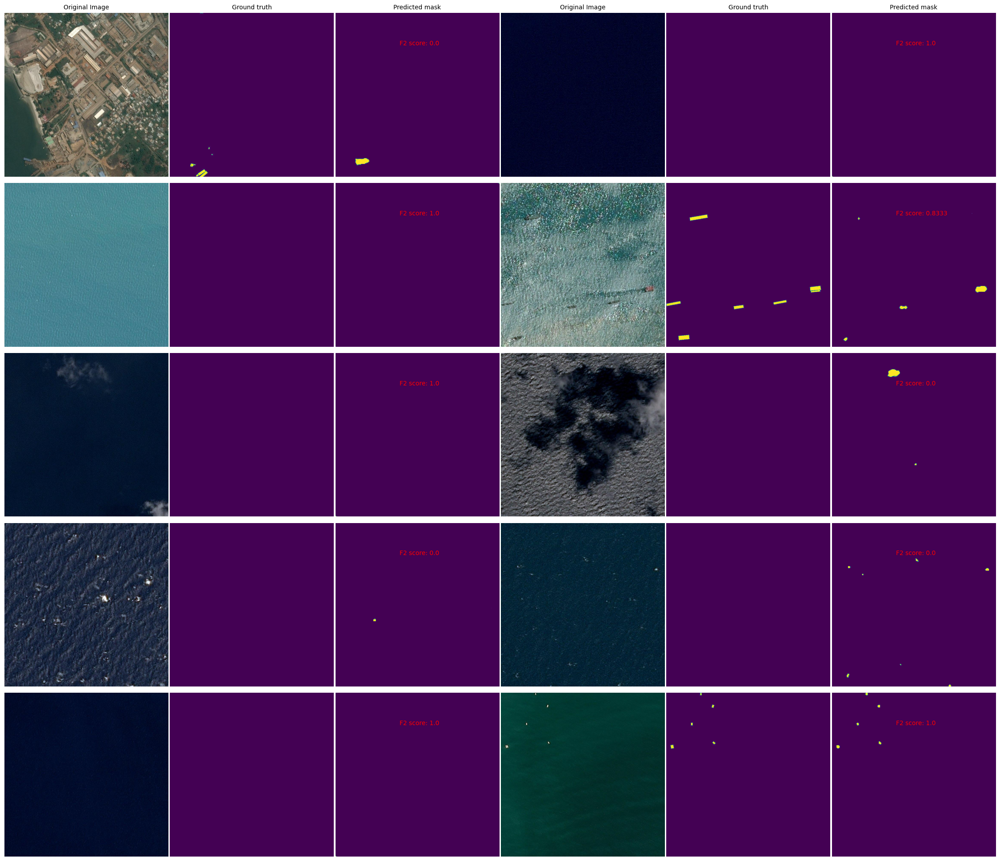

1/1 [==============================] - 0s 36ms/step


<Figure size 640x480 with 0 Axes>

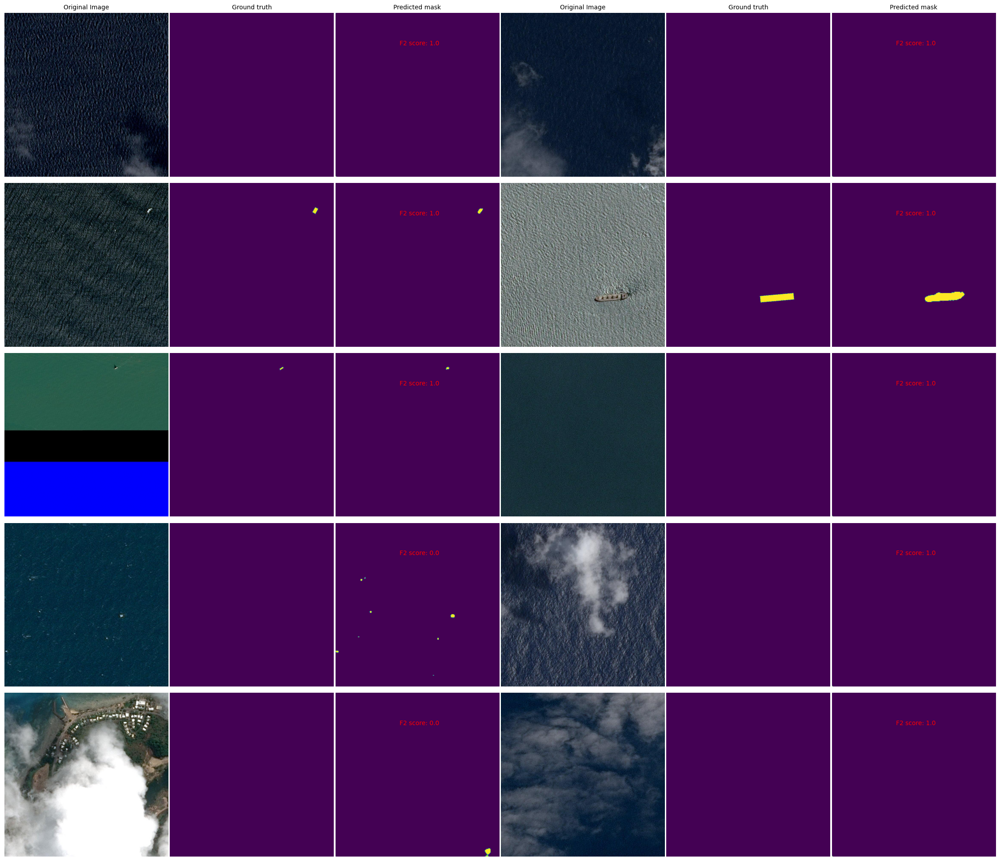

1/1 [==============================] - 0s 39ms/step


<Figure size 640x480 with 0 Axes>

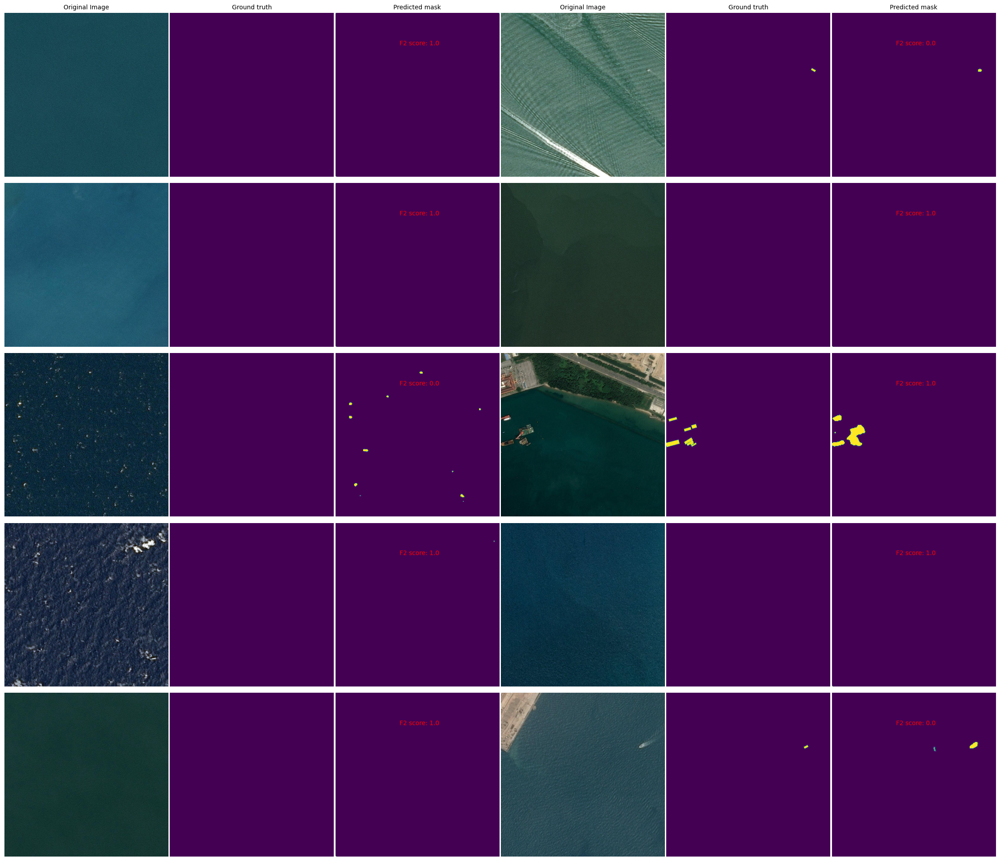

1/1 [==============================] - 0s 36ms/step


<Figure size 640x480 with 0 Axes>

KeyboardInterrupt: 

In [5]:
import segmentation_models as sm
import skimage.transform as st

image_path='dataset/val_images/images/'
mask_path='dataset/val_masks/masks/'


dice_loss = sm.losses.DiceLoss()

IOU_score=sm.metrics.IOUScore(threshold=0.5)
f2_score=sm.metrics.FScore(threshold=0.5,beta=2)
F2_score_array_256=[]

F2_score_metric=F2_score(threshold=[0.5],batch_processing=False)

unet_model=tf.keras.models.load_model('u_net_segmentation_model_256pix_40ep.h5',custom_objects={'dice_loss':dice_loss,'f2-score':f2_score,'iou_score':IOU_score})


images=os.listdir(path=image_path)
for batch_ind,img_temp in enumerate(images[:60:10]):
    plt.figure()
    fig, axs = plt.subplots(nrows=5, ncols=6,figsize=(27,20))

    plt.subplots_adjust(
        left=0.074, bottom=0.043,right=0.9,top=1,wspace=0.01, hspace=0
    )

    for ax in fig.axes: #Turn off axes
        ax.axison = False

    axs[0][0].set_title(('Original Image'), fontdict={'fontsize': 10})
    axs[0][1].set_title('Ground truth', fontdict={'fontsize': 10})
    axs[0][2].set_title('Predicted mask', fontdict={'fontsize': 10})
    axs[0][3].set_title(('Original Image'), fontdict={'fontsize': 10})
    axs[0][4].set_title('Ground truth', fontdict={'fontsize': 10})
    axs[0][5].set_title('Predicted mask', fontdict={'fontsize': 10})

    for index,image in enumerate(images[(batch_ind)*10:(batch_ind+1)*10]):
        
        img_test = plt.imread(image_path + image) / 255
        image = re.sub('.jpg', '_train_mask.jpg', image)
        img_mask_test = plt.imread(mask_path + image) / 255

        img_predict_test = unet_model.predict(
            x=tf.reshape(tf.image.resize(img_test, size=(256, 256)), shape=(-1, 256, 256, 3))) #Predict a mask

        new_img_mask_test = st.resize(img_mask_test, (256, 256), order=0, preserve_range=True, anti_aliasing=False) #Change size of ground truth image to 256 x 256 pixels 


        F2_score_metric.update_state(new_img_mask_test,img_predict_test) #Evaluate F2 score
        F2_result=F2_score_metric.result()
        F2_score_array_256.append(F2_result.numpy())

        f2_score_text='F2 score: '+ str(round(F2_result.numpy(),4))

        if(index>4):
            axs[index-5][3].imshow(img_test)

            axs[index-5][4].imshow(img_mask_test)

            axs[index-5][5].imshow(np.squeeze(img_predict_test))
            axs[index-5][5].text(100,50,f2_score_text,color='red',fontsize=10)
        else:
            axs[index][0].imshow(img_test)

            axs[index][1].imshow(img_mask_test)

            axs[index][2].imshow(np.squeeze(img_predict_test))
            axs[index][2].text(100,50,f2_score_text,color='red',fontsize=10)
        
    plt.show()
print('Average F2 score:', np.mean(np.array(F2_score_array_256)))


# Comparison
Some of prediction that seems to predict a location of the ship has a 0 value of F2 score. For example, the second photo (in left side) in 4th set . Mask correctly shows a location but not overlaping the full size of the ship. If we check our calculations, then this overlap will be 30 pixels and union 118. The division of these elements is about 0.25 that is lower than threshold (0.5 and higher). So, in our logic this mask will be predicted as false positive because ground truth and predicted mask have some overlap and not equals to zero. 


Comparing result of two models on the same photo, we can mention that in some cases there're ships that have not been recognized by model that trained on smaller image's size. I guess this problem comes from interpolation during changing image size. Color of ship could be mixed with the ocean color or other things that are around the ship, as a result, we would lose some information from the image. In a result i want to output average F2 score for two models on the same data.

In [36]:
print('Average F2 score on original image size (768x768):',np.mean(np.array(F2_score_array_768)))
print('Average F2 score on small image size (256x256):',np.mean(np.array(F2_score_array_256)))

Average F2 score on original image size (768x768): 0.7497405
Average F2 score on small image size (256x256): 0.70335877
